In [1]:
import sys

In [2]:
sys.executable

'/home/ubuntu/anaconda3/envs/scgpt_conda/bin/python'

In [3]:
import numpy

In [4]:
import scgpt; # silencing the warning about flash attention
# - kind of a pain to install and won't need it unless training

/home/ubuntu/anaconda3/envs/scgpt_conda/lib/python3.9/site-packages/scgpt/model/model.py:21: UserWarning: flash_attn is not installed
  warnings.warn("flash_attn is not installed")
/home/ubuntu/anaconda3/envs/scgpt_conda/lib/python3.9/site-packages/scgpt/model/multiomic_model.py:19: UserWarning: flash_attn is not installed
  warnings.warn("flash_attn is not installed")
/home/ubuntu/anaconda3/envs/scgpt_conda/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
import copy
import json
import os
from pathlib import Path
import sys
import warnings

In [6]:
import torch
from anndata import AnnData
import scanpy as sc
import numpy as np

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import pandas as pd
import tqdm

In [8]:
import gseapy as gp

from torchtext.vocab import Vocab
from torchtext._torchtext import (
    Vocab as VocabPybind,
)

In [9]:
sys.path.insert(0, "../")
import scgpt as scg
from scgpt.tasks import GeneEmbedding
from scgpt.tokenizer.gene_tokenizer import GeneVocab
from scgpt.model import TransformerModel
from scgpt.preprocess import Preprocessor
from scgpt.utils import set_seed

os.environ["KMP_WARNINGS"] = "off"
warnings.filterwarnings('ignore')

In [88]:
import fitz  # PyMuPDF
import matplotlib.pyplot as plt
from PIL import Image
import io

def visualize_pdf(pdf_path):
    """
    Visualizes a PDF in a Jupyter notebook by displaying each page as an image.

    Parameters:
        pdf_path (str): The file path to the PDF document.
    """
    # Open the PDF
    doc = fitz.open(pdf_path)
    
    # Iterate over each page in the PDF
    for page_num in range(doc.page_count):
        page = doc.load_page(page_num)  # Load the page
        pix = page.get_pixmap()  # Render the page as an image
        
        # Convert the image to a format suitable for Matplotlib
        img = Image.open(io.BytesIO(pix.tobytes("png")))
        
        # Display the image
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Page {page_num + 1}")
        plt.show()
    
    # Close the document
    doc.close()


In [10]:
set_seed(42)
pad_token = "<pad>"
special_tokens = [pad_token, "<cls>", "<eoc>"]
n_hvg = 1200
n_bins = 51
mask_value = -1
pad_value = -2
n_input_bins = n_bins

In [11]:
! ls

Anaconda3-2024.06-1-Linux-x86_64.sh  lib	    scgpt2.ipynb
Untitled.ipynb			     scGPT-arizona  scgpt2.ipynb.invalid
anaconda3			     scGPT_bc	    scgpt3.ipynb
cosine_similarity_graph.html	     scgpt.ipynb
data				     scgpt1.ipynb


In [12]:
model_dir = Path("scGPT_bc")

In [13]:
model_config_file = model_dir / "args.json"
model_config_file

PosixPath('scGPT_bc/args.json')

In [14]:
model_file = model_dir / "best_model.pt"
model_file

PosixPath('scGPT_bc/best_model.pt')

In [15]:
vocab_file = model_dir / "vocab.json"

In [16]:
special_tokens

['<pad>', '<cls>', '<eoc>']

In [17]:
vocab = GeneVocab.from_file(vocab_file)

for s in special_tokens:
        if s not in vocab:
            vocab.append_token(s)

In [18]:
vocab

GeneVocab()

In [19]:
with open(model_config_file, "r") as f:
    model_configs = json.load(f)
print(f"resume model from {model_file} weights, model args override the {model_config_file} config")

resume model from scGPT_bc/best_model.pt weights, model args override the scGPT_bc/args.json config


In [20]:
embsize = model_configs["embsize"]
nhead = model_configs["nheads"]
d_hid = model_configs["d_hid"]
nlayers = model_configs["nlayers"]
n_layers_cls = model_configs["n_layers_cls"]

In [21]:
embsize

512

In [22]:
nhead

8

In [23]:
d_hid

512

In [24]:
nlayers

12

In [25]:
n_layers_cls

3

In [26]:
gene2idx = vocab.get_stoi()

In [27]:
gene2idx

{'hsa-mir-423': 36570,
 'ZZEF1': 36564,
 'ZYX': 36563,
 'ZYG11A': 36561,
 'ZXDB': 36559,
 'ZXDA': 36558,
 'ZW10': 36555,
 'ZUP1': 36554,
 'ZSWIM9': 36553,
 'ZSWIM3': 36546,
 'ZSCAN5C': 36542,
 'ZSCAN5B': 36541,
 'ZSCAN26': 36533,
 'ZSCAN23': 36531,
 'ZSCAN22': 36530,
 'ZSCAN21': 36529,
 'ZSCAN2': 36527,
 'ZSCAN16-AS1': 36525,
 'ZSCAN16': 36524,
 'ZSCAN12': 36523,
 'ZRANB3': 36519,
 'ZRANB1': 36515,
 'ZPLD1': 36513,
 'ZP4': 36510,
 'ZP3': 36509,
 'ZP1': 36507,
 'ZNRF3': 36503,
 'ZNRF1': 36501,
 'ZNRD2-AS1': 36500,
 'ZNNT1': 36498,
 'ZNHIT3': 36496,
 'ZNHIT2': 36495,
 'ZNF99': 36492,
 'ZNF880': 36484,
 'ZNF879': 36483,
 'ZNF875': 36481,
 'ZNF865': 36480,
 'ZNF860': 36478,
 'ZNF853': 36477,
 'ZNF85': 36474,
 'ZNF846': 36473,
 'ZNF841': 36469,
 'ZNF84': 36467,
 'ZNF837': 36465,
 'ZNF835': 36463,
 'ZNF831': 36462,
 'ZNF830': 36461,
 'ZNF813': 36453,
 'ZNF808': 36451,
 'ZNF804B': 36449,
 'ZNF80': 36446,
 'ZNF8-DT': 36445,
 'ZNF8': 36444,
 'ZNF799': 36443,
 'ZNF793-AS1': 36442,
 'ZNF791': 364

In [28]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [29]:
device

device(type='cuda')

In [30]:
ntokens = len(vocab)
print(f"The size of the vocabulary is {ntokens}")

The size of the vocabulary is 36574


In [31]:
model = TransformerModel(
    ntokens,
    embsize,
    nhead,
    d_hid,
    nlayers,
    vocab=vocab,
    pad_value=pad_value, 
    n_input_bins=n_input_bins)

In [32]:
try:
    model.load_state_dict(torch.load(model_file))
    print(f"Loading all model params from {model_file}")
except:
    # only load parameters that are in the model and match the correct size
    model_dict = model.state_dict()
    pretrained_dict = torch.load(model_file)
    pretrained_dict = {k : v for k, v in pretrained_dict.items() if k in model_dict and v.shape == model_dict[k].shape}
    for k, v in pretrained_dict.items():
        print(f"Loading parameters {k} with shape {v.shape}")
        model_dict.update(pretrained_dict)
        model.load_state_dict(model_dict)

model.to(device)

Loading parameters encoder.embedding.weight with shape torch.Size([36574, 512])
Loading parameters encoder.enc_norm.weight with shape torch.Size([512])
Loading parameters encoder.enc_norm.bias with shape torch.Size([512])
Loading parameters value_encoder.linear1.weight with shape torch.Size([512, 1])
Loading parameters value_encoder.linear1.bias with shape torch.Size([512])
Loading parameters value_encoder.linear2.weight with shape torch.Size([512, 512])
Loading parameters value_encoder.linear2.bias with shape torch.Size([512])
Loading parameters value_encoder.norm.weight with shape torch.Size([512])
Loading parameters value_encoder.norm.bias with shape torch.Size([512])
Loading parameters transformer_encoder.layers.0.self_attn.out_proj.weight with shape torch.Size([512, 512])
Loading parameters transformer_encoder.layers.0.self_attn.out_proj.bias with shape torch.Size([512])
Loading parameters transformer_encoder.layers.0.linear1.weight with shape torch.Size([512, 512])
Loading parame

TransformerModel(
  (encoder): GeneEncoder(
    (embedding): Embedding(36574, 512, padding_idx=36571)
    (enc_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (value_encoder): ContinuousValueEncoder(
    (dropout): Dropout(p=0.5, inplace=False)
    (linear1): Linear(in_features=1, out_features=512, bias=True)
    (activation): ReLU()
    (linear2): Linear(in_features=512, out_features=512, bias=True)
    (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-11): 12 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
        )
        (linear1): Linear(in_features=512, out_features=512, bias=True)
        (dropout): Dropout(p=0.5, inplace=False)
        (linear2): Linear(in_features=512, out_features=512, bias=True)
        (norm1): LayerNorm((512,), eps=1e-05, el

In [33]:
data_dir = Path("./data")

In [34]:
data_dir

PosixPath('data')

In [35]:
adata = sc.read(str(data_dir/"Immune_ALL_human.h5ad"), cache=True)

In [36]:
adata

AnnData object with n_obs × n_vars = 33506 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

In [37]:
ori_batch_col = "batch"

In [38]:
adata.obs["celltype"] = adata.obs["final_annotation"].astype(str)
data_is_raw = False

In [39]:
n_hvg

1200

In [40]:
# preprocess the anndata object
preprocessor = Preprocessor(use_key = "X",
                           filter_gene_by_counts=3,
                           filter_cell_by_counts=False,
                           normalize_total=1e4, 
                           result_normed_key="X_normed",
                           log1p=data_is_raw,
                           result_log1p_key="X_log1p",
                           subset_hvg=n_hvg,
                           hvg_flavor="seurat_v3" if data_is_raw else "cell_ranger",
                           binning=n_bins, # whether to bin the raw data and what number of bins
                           result_binned_key = "X_binned") # key in adata.layers to store the binned data

In [41]:
preprocessor(adata, batch_key="batch")

scGPT - INFO - Filtering genes by counts ...
scGPT - INFO - Normalizing total counts ...
scGPT - INFO - Subsetting highly variable genes ...
scGPT - INFO - Binning data ...


In [42]:
adata

AnnData object with n_obs × n_vars = 33506 × 1200
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue', 'celltype'
    var: 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'bin_edges'
    layers: 'counts', 'X_normed', 'X_binned'

In [43]:
# access data independent gene embeddings
gene_ids = np.array([id for id in gene2idx.values()])
gene_embeddings = model.encoder(torch.tensor(gene_ids, dtype=torch.long).to(device))
gene_embeddings_vec = gene_embeddings.detach().cpu().numpy()

In [44]:
gene_embeddings

tensor([[-1.0721, -1.6595,  0.1648,  ..., -0.1175,  1.0547, -1.4533],
        [ 0.3351,  0.2272, -1.9701,  ..., -2.0266, -0.1298, -1.2059],
        [ 0.7244,  2.1800,  0.2197,  ..., -1.6308,  1.6810,  0.6335],
        ...,
        [ 0.3735, -1.2089, -1.0787,  ..., -0.5280,  0.7534, -1.0783],
        [ 0.4410,  0.8809, -0.3159,  ..., -1.4844, -0.5463, -0.5517],
        [ 1.1001,  1.2924,  1.1853,  ...,  0.2653, -0.6985, -0.4949]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [45]:
gene_ids

array([36570, 36564, 36563, ..., 20744, 32782, 20745])

In [46]:
#gene2idx.keys()

In [47]:
genes_names_embeddings = dict(zip(gene2idx.keys(), gene_embeddings_vec))

In [48]:
len(gene2idx.keys())

36574

In [49]:
len(gene_embeddings_vec)

36574

In [50]:
gene_embeddings = {gene: gene_embeddings_vec[i] for i, gene in enumerate(gene2idx.keys()) if gene in adata.var.index.tolist()}

In [51]:
gene_embeddings

{'ZNF691': array([-0.14376047,  0.65908855,  0.6251126 ,  0.6652074 , -1.750324  ,
        -1.229724  ,  1.4109045 ,  0.59629095,  0.10209354,  0.23094955,
        -0.6387523 ,  1.7823719 ,  0.5680742 ,  0.13368173, -0.32839167,
         0.68434155,  0.10455111, -0.07900528,  0.6376839 , -1.5852875 ,
        -1.7392547 , -1.4368172 , -1.7974652 , -0.59923446, -1.7535354 ,
        -0.7927766 ,  0.11908876, -1.2458159 ,  2.506916  , -1.0723855 ,
         0.9009217 ,  0.6894494 , -0.1364077 , -0.71312106, -0.4374555 ,
         0.41912094,  1.3792844 ,  0.11822743, -0.7428207 , -1.7430704 ,
         0.49667138, -0.5958636 ,  0.03825766, -1.5362704 ,  1.4594454 ,
        -1.5690498 , -2.8569484 , -0.35340255,  0.10824604,  0.17228672,
        -0.5499258 , -0.7569477 , -1.1037087 , -0.21441132, -0.34931135,
         0.5185192 , -0.593773  , -2.2478845 , -0.42549375,  1.317686  ,
         1.7436302 ,  0.06375789,  0.5698249 , -1.0807867 ,  0.47325915,
         0.8276951 , -1.3047972 , -0.7595

In [52]:
print(f"Retrieved gene embeddings for {len(gene_embeddings)} genes") 

Retrieved gene embeddings for 1170 genes


In [53]:
#construct gene embedding network

In [54]:
# this is the genes and embeddings for the full unfiltered list
len(genes_names_embeddings)

36574

In [55]:
# this is the genes and embeddings for the subset of human immune highly variable genes
len(gene_embeddings)

1170

In [56]:
# this is the gene embedding network (check where the GeneEmbedding object comes from)
embed = GeneEmbedding(gene_embeddings)

100%|██████████| 1170/1170 [00:00<00:00, 1214987.79it/s]


In [57]:
embed

In [58]:
# leiden clustering on the gene embedding network

In [59]:
gdata = embed.get_adata(resolution=40)

In [60]:
gdata

AnnData object with n_obs × n_vars = 1170 × 512
    obs: 'leiden'
    uns: 'neighbors', 'leiden', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [61]:
# all gene clusters

In [62]:
metagenes = embed.get_metagenes(gdata)

# Grouping Metagenes

## Metagene Grouping via Leiden Clustering:
The `get_adata` method clusters the gene embeddings using the Leiden algorithm, a popular clustering method in single-cell analysis. This method is applied on the AnnData object (`gdata`) created from the embeddings matrix. After computing the neighborhood graph (`sc.pp.neighbors(gdata, use_rep="X")`), Leiden clustering is performed with `sc.tl.leiden(gdata, resolution=resolution)`. Each gene is assigned a cluster label based on the Leiden algorithm, which groups similar genes into clusters.

## Extracting Metagenes:
The `get_metagenes` method is used to extract metagenes from the clustered data. It initializes an empty dictionary (`metagenes`) and populates it by mapping cluster labels (from `gdata.obs["leiden"]`) to the associated genes (`gdata.obs.index`). As a result, each cluster (or metagene) is represented as a list of genes belonging to that cluster.

## Scoring Metagenes:
The `score_metagenes` method calculates scores for each metagene using the `sc.tl.score_genes` function from the Scanpy library. For each metagene (key `p` in the `metagenes` dictionary), it computes a score based on the expression of genes in that metagene. This score is then added to the `adata.obs` DataFrame with the column name formatted as `"{cluster}_SCORE"`. The scores are then scaled to a range between 0 and 1 using `MinMaxScaler`.

## Visualization and Additional Analysis
The `plot_metagenes_scores` method visualizes the metagene scores using a heatmap (via Seaborn’s `clustermap`), allowing for easy inspection of score distributions across different conditions or cell types defined in the `adata.obs[column]`. Other visualization functions like `plot_similarities` and `plot_metagene` help further in exploring and understanding the relationships between genes and metagenes by plotting similarities and highlighting specific metagenes on UMAP plots.

**Summary** - metagenes are grouped through clustering of gene embeddings using the Leiden algorithm, and the scores are computed as scaled expression scores of genes within each metagene, then visualized via heatmaps and network graphs. 

In [63]:
len(metagenes)

349

<Axes: >

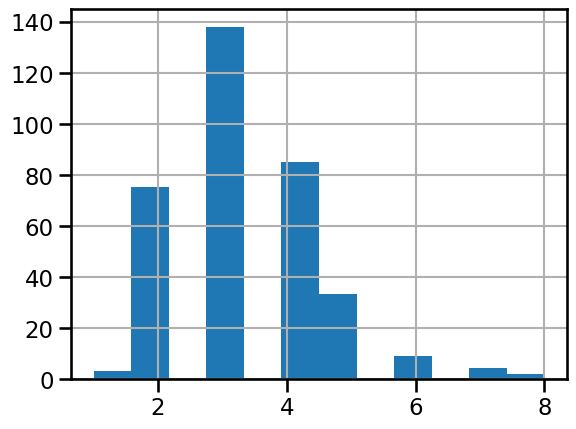

In [64]:
import pandas as pd

df = pd.DataFrame()
lengths=[]
for mg, genes in metagenes.items():
    lengths.append(len(genes))
df['metagene_counts']= lengths

df['metagene_counts'].hist(bins=12)

# Most metagene clusters have fewer than 6 gene members

In [65]:
df[df['metagene_counts']>6]

,metagene_counts
15,7
68,7
100,7
124,8
167,7
210,8


In [66]:
# Obtain the set of gene programs with greater or equal to 7 genes 
mgs = dict()
for mg, genes in metagenes.items():
    if len(genes) > 6:
        mgs[mg] = genes

In [67]:
mgs

{'4': ['XCL2', 'XCL1', 'TNFRSF4', 'TNFRSF18', 'TNFRSF9', 'PTPN22', 'SH2D2A'],
 '3': ['TINAGL1', 'TIE1', 'RHOC', 'CNN3', 'HSPG2', 'ECM1', 'ARHGAP29'],
 '2': ['TXNIP', 'SELL', 'CD53', 'IFI16', 'JAK1', 'LAPTM5', 'PTPRC'],
 '0': ['TNFSF4',
  'RGS18',
  'DENND2C',
  'SELP',
  'DNM3',
  'PBX1',
  'NEXN',
  'PDZK1IP1'],
 '5': ['RGS2', 'DNAJB4', 'IER5', 'ATF3', 'G0S2', 'PTGS2', 'HSPA6'],
 '1': ['NUF2', 'DEPDC1', 'ASPM', 'CDC20', 'GPSM2', 'CDCA8', 'CENPF', 'KIF2C']}

In [96]:
# plot via heatmap

In [68]:
def plot_metagenes_scores(adata, metagenes, column, plot=None):
    plt.figure(figsize=(8, 10))
    matrix = []
    meta_genes = []
    cfnum = 1
    cfams = dict()
    for cluster, vector in metagenes.items():
        row = []
        cts = []
        for ct in set(adata.obs[column]):
            sub = adata[adata.obs[column] == ct]
            val = np.mean(sub.obs[str(cluster) + "_SCORE"].tolist())
            row.append(val)
            cts.append(ct)
        matrix.append(row)
        label = str(cluster) + "_SCORE: " + ", ".join(vector[:10])
        if len(set(vector)) > 10:
            label += "*"
        meta_genes.append(label)
        cfams[cluster] = label
        cfnum += 1
    matrix = np.array(matrix)
    df = pd.DataFrame(matrix, index=meta_genes, columns=cts)
    plt.figure()
    sns.clustermap(
        df,
        figsize=(8, 8),
        dendrogram_ratio=0.1,
        cmap="magma",
        yticklabels=True,
        standard_scale=0,
    )
    plt.tight_layout()
    if plot:
        plt.savefig(plot)

<Figure size 800x1000 with 0 Axes>

<Figure size 640x480 with 0 Axes>

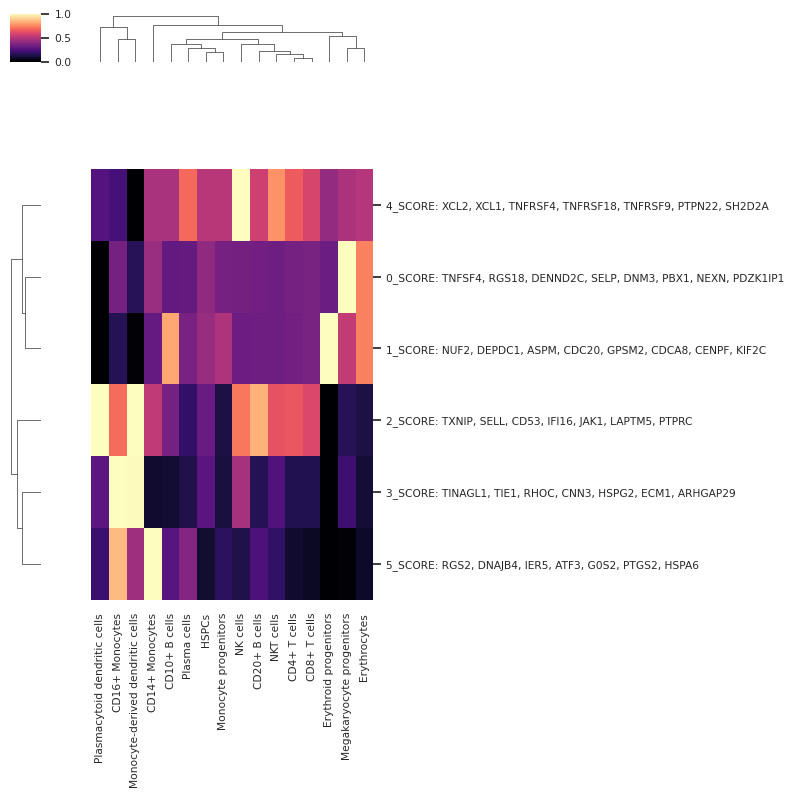

In [69]:
sns.set(font_scale=0.7)
embed.score_metagenes(adata, metagenes)
plot_metagenes_scores(adata, mgs, "celltype")

In [70]:
genes = mgs['1']
genes

['NUF2', 'DEPDC1', 'ASPM', 'CDC20', 'GPSM2', 'CDCA8', 'CENPF', 'KIF2C']

## 1. NUF2 (NUF2 Component of NDC80 Kinetochore Complex)
- **Function:** NUF2 is a part of the NDC80 kinetochore complex, which is essential for proper chromosome alignment and segregation during mitosis. It plays a crucial role in attaching spindle microtubules to the kinetochore of chromosomes, ensuring accurate chromosome segregation.
- **Immune System Relation:** Proper cell division is critical for immune cell proliferation. Dysregulation of genes like NUF2 could affect immune cell function and development, potentially contributing to cancer, including immunological cancers like lymphomas.

## 2. DEPDC1 (DEP Domain Containing 1)
- **Function:** DEPDC1 is involved in regulating cell proliferation and has been implicated in various cancers. It is known to suppress immune responses, which may help tumor cells evade immune surveillance.
- **Immune System Relation:** Overexpression of DEPDC1 can inhibit the immune system's ability to detect and destroy abnormal cells, potentially contributing to immune evasion in cancers.

## 3. ASPM (Abnormal Spindle Microtubule Assembly)
- **Function:** ASPM is critical for spindle organization during mitosis, particularly in regulating spindle pole formation and maintaining correct spindle orientation. It is essential for the division of neural progenitor cells and has roles in brain development.
- **Immune System Relation:** While not directly linked to the immune system, ASPM’s role in cell division suggests it could be important for the proliferation of immune cells, especially in rapidly dividing progenitor cells in the bone marrow.

## 4. CDC20 (Cell Division Cycle 20)
- **Function:** CDC20 is an activator of the anaphase-promoting complex/cyclosome (APC/C), a key regulator of cell cycle progression from metaphase to anaphase. It is crucial for the proper segregation of chromosomes.
- **Immune System Relation:** CDC20's role in cell cycle regulation can impact the proliferation of immune cells. Overexpression or mutations in CDC20 can lead to genomic instability, which may influence immune cell function and contribute to cancer.

## 5. GPSM2 (G Protein Signaling Modulator 2)
- **Function:** GPSM2 is involved in the regulation of asymmetric cell division and cell polarity, which is important in maintaining stem cell populations and proper cell differentiation.
- **Immune System Relation:** Asymmetric cell division is important for maintaining immune stem cells and progenitors. Disruption in GPSM2 function can affect immune system homeostasis and the balance of immune cell types.

## 6. CDCA8 (Cell Division Cycle Associated 8)
- **Function:** CDCA8, also known as Borealin, is part of the chromosomal passenger complex (CPC) involved in regulating mitosis, particularly in chromosome alignment and cytokinesis.
- **Immune System Relation:** Proper function of CDCA8 ensures accurate immune cell division. Dysregulation can contribute to chromosomal instability, affecting immune responses and possibly leading to oncogenesis.

## 7. CENPF (Centromere Protein F)
- **Function:** CENPF is involved in chromosome segregation and kinetochore function during cell division. It is necessary for the progression of cells through mitosis and plays a role in microtubule attachment at kinetochores.
- **Immune System Relation:** CENPF is critical for the rapid proliferation of immune cells, such as lymphocytes during an immune response. Misregulation can disrupt immune function and contribute to disease.

## 8. KIF2C (Kinesin Family Member 2C)
- **Function:** KIF2C, also known as MCAK, is a motor protein that depolymerizes microtubules, thus playing a role in regulating microtubule dynamics during mitosis. It helps ensure proper chromosome alignment and segregation.
- **Immune System Relation:** KIF2C is important for mitotic fidelity in proliferating immune cells. Abnormal KIF2C activity can lead to defective immune cell division and function.

## Relationship to Human Immune Cells and Erythocytes/Progenitors
- These genes are interconnected through their roles in mitosis and cell cycle regulation. Misregulation of these genes can lead to chromosomal instability, aneuploidy, or uncontrolled cell proliferation, which can impact immune cell function and contribute to immune evasion in cancers.
  
- The correct functioning of these genes is crucial in erythroid progenitors because they are highly proliferative cells. Disruptions in mitosis and cell cycle regulation can impair erythropoiesis, leading to ineffective production of erythrocytes, which can result in conditions such as anemia. Errors in the progenitor stages can affect the quality and quantity of erythrocytes produced. **Higher score observed for erythroid progenitor than erythrocyte cell type**

In [71]:
mgs['4']

['XCL2', 'XCL1', 'TNFRSF4', 'TNFRSF18', 'TNFRSF9', 'PTPN22', 'SH2D2A']

## 1. XCL2 (Chemokine (C Motif) Ligand 2)
- **Function:** XCL2 is a chemokine involved in immune cell trafficking, specifically acting on cells that express the XCR1 receptor. It helps direct immune cells like T cells and natural killer (NK) cells to sites of inflammation or infection.
- **Immune System Relation:** XCL2 plays a role in guiding immune cells to areas where they are needed, enhancing the body’s ability to respond to infections or inflammation effectively.

## 2. XCL1 (Chemokine (C Motif) Ligand 1)
- **Function:** XCL1, also known as lymphotactin, is another chemokine that binds to the XCR1 receptor on dendritic cells. It is involved in the recruitment of T cells and NK cells, and it plays a critical role in the immune response by promoting cross-presentation of antigens by dendritic cells.
- **Immune System Relation:** XCL1 is important for adaptive immune responses, particularly in enhancing the presentation of antigens to T cells, which is crucial for the activation of specific immune responses.

## 3. TNFRSF4 (Tumor Necrosis Factor Receptor Superfamily Member 4)
- **Function:** Also known as OX40, TNFRSF4 is a co-stimulatory receptor found on activated T cells. It provides signals that promote T cell proliferation, survival, and memory formation.
- **Immune System Relation:** TNFRSF4 enhances T cell responses and is critical for the development of effective and long-lasting immune memory, which is vital for protection against recurrent infections and for vaccine efficacy.

## 4. TNFRSF18 (Tumor Necrosis Factor Receptor Superfamily Member 18)
- **Function:** Known as GITR (Glucocorticoid-Induced TNFR-Related protein), TNFRSF18 is expressed on regulatory T cells (Tregs) and other activated immune cells. It plays a role in modulating immune responses, particularly in balancing immune activation and suppression.
- **Immune System Relation:** TNFRSF18 is involved in the regulation of immune tolerance and the prevention of autoimmunity. It modulates the activity of Tregs, which are essential for maintaining immune homeostasis.

## 5. TNFRSF9 (Tumor Necrosis Factor Receptor Superfamily Member 9)
- **Function:** Also known as 4-1BB, TNFRSF9 is a costimulatory receptor found on activated T cells, NK cells, and other immune cells. It promotes the survival, proliferation, and function of these cells upon activation.
- **Immune System Relation:** TNFRSF9 enhances T cell and NK cell responses, making it an important target for cancer immunotherapy, where boosting the activity of these immune cells can enhance the body’s ability to fight tumors.

## 6. PTPN22 (Protein Tyrosine Phosphatase, Non-Receptor Type 22)
- **Function:** PTPN22 is a protein tyrosine phosphatase that negatively regulates T cell receptor (TCR) signaling. It acts as a checkpoint in T cell activation and plays a role in the regulation of immune responses.
- **Immune System Relation:** Variants in PTPN22 are associated with an increased risk of autoimmune diseases such as rheumatoid arthritis, lupus, and type 1 diabetes, due to its role in dampening T cell activation and maintaining immune tolerance.

## 7. SH2D2A (SH2 Domain Containing 2A)
- **Function:** SH2D2A, also known as TSAd, is involved in T cell signaling and activation. It interacts with other signaling molecules to modulate the activation and proliferation of T cells.
- **Immune System Relation:** SH2D2A plays a role in fine-tuning T cell responses, influencing the strength and duration of immune activation. Its function is critical for the regulation of immune responses, particularly in ensuring that T cells are activated appropriately in response to infections while avoiding excessive immune activation.

## Summary
- These genes are integral to various aspects of immune regulation, including cell signaling, immune cell trafficking, activation, and tolerance.
- They contribute to the fine balance between immune activation against pathogens and the maintenance of tolerance to prevent autoimmunity.
- Dysregulation or genetic variations in these genes can lead to immune disorders, such as autoimmune diseases or impaired immune responses.

# Cosine similarity

In [72]:
df1 = pd.DataFrame(columns=['Gene', 'Similarity', 'Gene1'])
dfs=[]
for i in tqdm.tqdm(genes):
    df2 = embed.compute_similarities(i, genes)
    df2['Gene1'] = i
    print(df2)
    dfs.append(df2)

df1 = pd.concat(dfs, ignore_index=True)
df1_sub = df1[df1['Similarity']<0.99].sort_values(by='Gene')

100%|██████████| 8/8 [00:00<00:00, 167.88it/s]

     Gene  Similarity Gene1
0    NUF2    1.000000  NUF2
1   CDCA8    0.387811  NUF2
2    ASPM    0.360940  NUF2
3   CDC20    0.355494  NUF2
4   CENPF    0.293461  NUF2
5   KIF2C    0.267847  NUF2
6  DEPDC1    0.248205  NUF2
7   GPSM2    0.226822  NUF2
     Gene  Similarity   Gene1
0  DEPDC1    1.000000  DEPDC1
1   CDC20    0.331460  DEPDC1
2   CENPF    0.323420  DEPDC1
3   CDCA8    0.280959  DEPDC1
4    ASPM    0.276403  DEPDC1
5    NUF2    0.248205  DEPDC1
6   KIF2C    0.235023  DEPDC1
7   GPSM2    0.196150  DEPDC1
     Gene  Similarity Gene1
0    ASPM    1.000000  ASPM
1   CENPF    0.429012  ASPM
2   CDC20    0.399831  ASPM
3    NUF2    0.360940  ASPM
4   CDCA8    0.322674  ASPM
5  DEPDC1    0.276403  ASPM
6   KIF2C    0.241336  ASPM
7   GPSM2    0.221666  ASPM
     Gene  Similarity  Gene1
0   CDC20    1.000000  CDC20
1   CENPF    0.417382  CDC20
2    ASPM    0.399831  CDC20
3    NUF2    0.355494  CDC20
4  DEPDC1    0.331460  CDC20
5   CDCA8    0.321583  CDC20
6   KIF2C    0.249208  

In [73]:
df1_sub

,Gene,Similarity,Gene1
12,ASPM,0.276403,DEPDC1
43,ASPM,0.322674,CDCA8
49,ASPM,0.429012,CENPF
34,ASPM,0.221666,GPSM2
26,ASPM,0.399831,CDC20
2,ASPM,0.360940,NUF2
61,ASPM,0.241336,KIF2C
44,CDC20,0.321583,CDCA8
60,CDC20,0.249208,KIF2C
9,CDC20,0.331460,DEPDC1


In [74]:
# Creates a graph from the cosine similarity network
input_node_weights = [(row['Gene'], row['Gene1'], round(row['Similarity'], 2)) for i, row in df1_sub.iterrows()]
G = nx.Graph()
G.add_weighted_edges_from(input_node_weights)

In [75]:
from pyvis.network import Network
import networkx as nx
from IPython.core.display import display, HTML

def visualize_cosine_similarity_network(graph, threshold=0.3, background_color='#FFFFFF', edge_color_large='#ADD8E6', edge_color_small='#C0C0C0', node_color='#0000FF', output_file="cosine_similarity_graph.html"):
    """
    Visualizes a cosine similarity network using Pyvis, highlighting strong edges.

    Parameters:
        G (networkx.Graph): The NetworkX graph to be visualized.
        thresh (float): The threshold for highlighting strong edges. Default is 0.4.
        background_color (str): Hex code for the background color of the graph. Default is black.
        edge_color_large (str): Hex code for the color of edges with weight above the threshold. Default is light blue.
        edge_color_small (str): Hex code for the color of edges with weight below the threshold. Default is grey.
        node_color (str): Hex code for the node color. Default is blue.
        output_file (str): The name of the output HTML file. Default is 'cosine_similarity_graph.html'.

    Returns:
        None: The function saves the interactive graph as an HTML file.
    """

    # Create a Pyvis Network object
    net = Network(notebook=True, bgcolor='#FFFFFF', cdn_resources='in_line')

    # Add physics controls
    net.show_buttons(filter_=['physics'])

    # Add nodes to Pyvis with customized attributes, including tooltips
    for node in graph.nodes(data=True):
        node_id = node[0]
        node_info = node[1]  # Any additional info in the node attributes
        net.add_node(node_id, color='#0000FF', title=f"Node: {node_id}")

    # Iterate over edges and add them to Pyvis with customized attributes, including correct cosine similarity labels
    for u, v, data in graph.edges(data=True):
        cosine_similarity = data.get('weight', 1)  # Cosine similarity as the weight
        edge_color = '#0000FF' if cosine_similarity > threshold else '#ADD8E6'
        edge_width = cosine_similarity * 10 if cosine_similarity > threshold else max(cosine_similarity, 0) * 10
        
        # Add edges with labels showing the correct cosine similarity (between 0 and 1) and tooltips
        net.add_edge(u, v, value=cosine_similarity, color=edge_color, width=edge_width, 
                     title=f"Edge: {u} - {v}\nCosine Similarity: {round(cosine_similarity, 2)}")

    # Generate the interactive graph as an HTML file
    net.show(output_file)
    
    # Display the generated HTML in the notebook
    display(HTML(output_file))


In [76]:
# Example usage:
# Assuming 'G' is your NetworkX graph
visualize_cosine_similarity_network(G)

cosine_similarity_graph.html


In [77]:
import matplotlib.pyplot as plt
import networkx as nx

def visualize_cosine_similarity_network_matplotlib(graph, threshold=0.3, figsize=(20, 20)):
    """
    Visualizes a cosine similarity network using matplotlib, highlighting strong edges based on a weight threshold.

    Parameters:
        graph (networkx.Graph): The NetworkX graph to be visualized.
        threshold (float): The edge weight threshold to highlight strong edges. Default is 0.4.
        figsize (tuple): The size of the figure for the plot. Default is (20, 20).
        
    Returns:
        None: The function displays the plot using matplotlib.
    """
    # Set up the plot
    plt.figure(figsize=figsize)

    # Get edge weights
    widths = nx.get_edge_attributes(graph, 'weight')

    # Separate edges into strong and weak based on the threshold
    elarge = [(u, v) for (u, v, d) in graph.edges(data=True) if d["weight"] > threshold]
    esmall = [(u, v) for (u, v, d) in graph.edges(data=True) if d["weight"] <= threshold]

    # Generate positions for nodes using spring layout
    pos = nx.spring_layout(graph, k=0.4, iterations=15, seed=3)

    # Calculate widths for strong and weak edges
    width_large = {key: val * 10 for key, val in widths.items() if val > threshold}
    width_small = {key: max(val, 0) * 10 for key, val in widths.items() if val <= threshold}

    # Draw weak edges
    nx.draw_networkx_edges(
        graph, pos,
        edgelist=width_small.keys(),
        width=list(width_small.values()),
        edge_color='lightblue',
        alpha=0.8
    )

    # Draw strong edges
    nx.draw_networkx_edges(
        graph, pos,
        edgelist=width_large.keys(),
        width=list(width_large.values()),
        edge_color='blue',
        alpha=0.5
    )

    # Draw node labels
    nx.draw_networkx_labels(graph, pos, font_size=25, font_family="sans-serif")

    # Draw edge labels for strong edges
    edge_labels = {k: widths[k] for k in elarge}
    nx.draw_networkx_edge_labels(graph, pos, edge_labels, font_size=15)

    # Adjust plot margins and remove axis
    ax = plt.gca()
    ax.margins(0.08)
    plt.axis("off")

    # Show the plot
    plt.show()

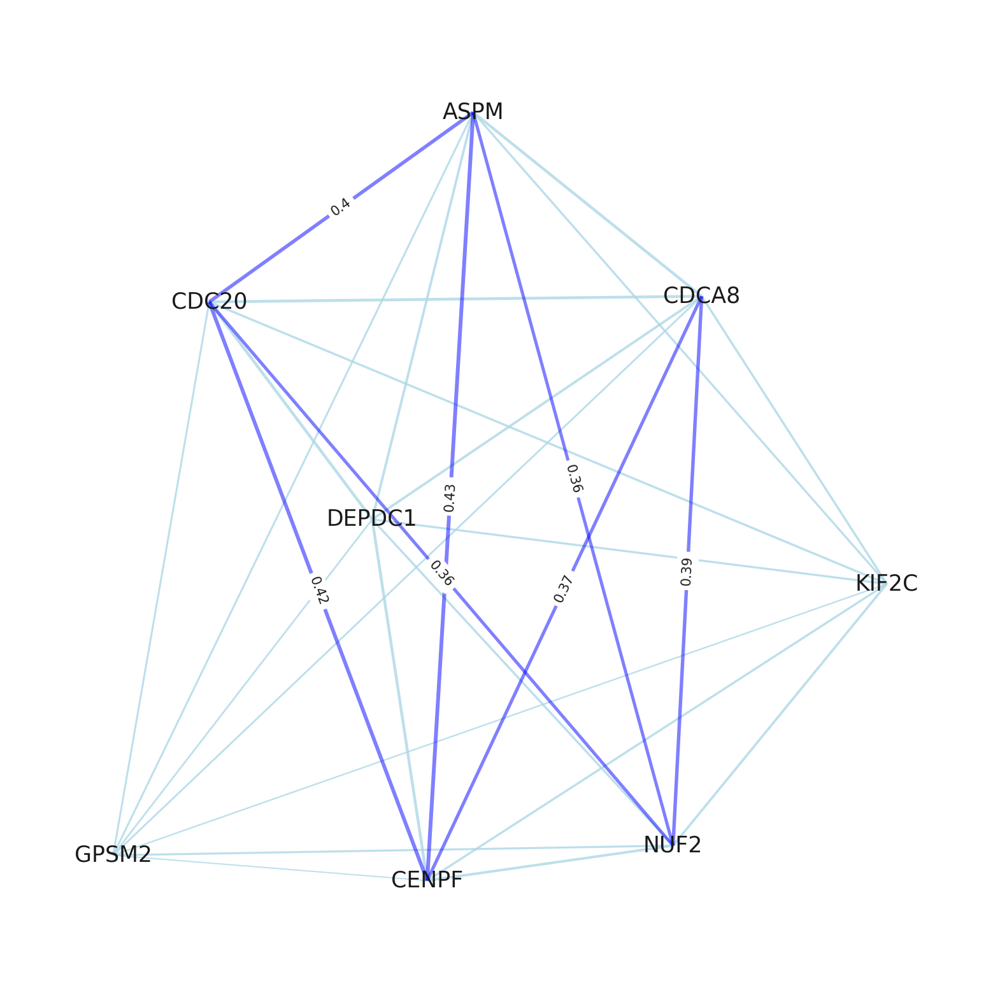

In [78]:
visualize_cosine_similarity_network_matplotlib(G, threshold=0.35)

# Reactome pathway enrichment analysis

In [83]:
# This is to get the number of terms in each database
# to properly adjust the p value (bonferroni)

df_database = pd.DataFrame(
data = [['GO_Biological_Process_2021', 6036],
['GO_Molecular_Function_2021', 1274],
['Reactome_2022', 1818]],
columns = ['dataset', 'term'])
# Select desired database for query; here use Reactome as an example
databases = ['Reactome_2022']
m = df_database[df_database['dataset'].isin(databases)]['term'].sum()
# p-value correction for total number of tests done
p_thresh = 0.05/m

print(f"This is the total number of terms searched {m}")
print(f"This is the Bonferroni adjusted p-value for {databases}: 0.05/{m} = {p_thresh}")

This is the total number of terms searched 1818
This is the Bonferroni adjusted p-value for Reactome_2022: 0.05/1818 = 2.7502750275027505e-05


In [81]:
df_database

,dataset,term
0,GO_Biological_Process_2021,6036
1,GO_Molecular_Function_2021,1274
2,Reactome_2022,1818


In [86]:
enr_Reactome = gp.enrichr(gene_list=genes,
                          gene_sets=databases,
                          organism='Human',
                          outdir='test/enr_Reactome',
                          cutoff=0.5)
out = enr_Reactome.results
out = out[out['P-value'] < p_thresh]
out

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,Reactome_2022,Unattached Kinetochores Signal Amplification V...,5/93,1.079702e-10,3.615662e-09,0,0,376.969697,8651.140236,CDC20;CENPF;NUF2;CDCA8;KIF2C
1,Reactome_2022,EML4 And NUDC In Mitotic Spindle Formation R-H...,5/97,1.338198e-10,3.615662e-09,0,0,360.507246,8195.961639,CDC20;CENPF;NUF2;CDCA8;KIF2C
2,Reactome_2022,Resolution Of Sister Chromatid Cohesion R-HSA-...,5/106,2.101951e-10,3.615662e-09,0,0,328.234323,7314.040471,CDC20;CENPF;NUF2;CDCA8;KIF2C
3,Reactome_2022,Mitotic Spindle Checkpoint R-HSA-69618,5/110,2.537307e-10,3.615662e-09,0,0,315.666667,6974.575402,CDC20;CENPF;NUF2;CDCA8;KIF2C
4,Reactome_2022,RHO GTPases Activate Formins R-HSA-5663220,5/119,3.782020e-10,4.311502e-09,0,0,290.614035,6305.043753,CDC20;CENPF;NUF2;CDCA8;KIF2C
5,Reactome_2022,Separation Of Sister Chromatids R-HSA-2467813,5/170,2.294317e-09,2.179601e-08,0,0,200.272727,3983.991471,CDC20;CENPF;NUF2;CDCA8;KIF2C
6,Reactome_2022,Mitotic Prometaphase R-HSA-68877,5/186,3.608592e-09,2.938425e-08,0,0,182.421731,3546.269006,CDC20;CENPF;NUF2;CDCA8;KIF2C
7,Reactome_2022,Mitotic Anaphase R-HSA-68882,5/232,1.094968e-08,7.085985e-08,0,0,145.117474,2659.996849,CDC20;CENPF;NUF2;CDCA8;KIF2C
8,Reactome_2022,Mitotic Metaphase And Anaphase R-HSA-2555396,5/233,1.118840e-08,7.085985e-08,0,0,144.473684,2645.080336,CDC20;CENPF;NUF2;CDCA8;KIF2C
9,Reactome_2022,RHO GTPase Effectors R-HSA-195258,5/269,2.297767e-08,1.235618e-07,0,0,124.545455,2190.598010,CDC20;CENPF;NUF2;CDCA8;KIF2C


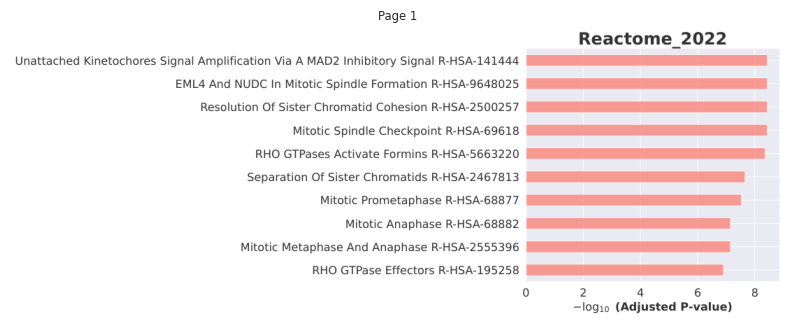

In [89]:
visualize_pdf('./test/enr_Reactome/Reactome_2022.Human.enrichr.reports.pdf')

In [90]:
df_database

,dataset,term
0,GO_Biological_Process_2021,6036
1,GO_Molecular_Function_2021,1274
2,Reactome_2022,1818


In [94]:
databases = df_database['dataset'].to_list()
m = df_database[df_database['dataset'].isin(databases)]['term'].sum()
# p-value correction for total number of tests done
p_thresh = 0.05/m

print(f"This is the total number of terms searched {m}")
print(f"This is the Bonferroni adjusted p-value for {databases}: 0.05/{m} = {p_thresh}")

enr_All = gp.enrichr(gene_list=genes,
                          gene_sets=databases,
                          organism='Human',
                          outdir='test/enr_All',
                          cutoff=0.5)
out = enr_Reactome.results
out = out[out['P-value'] < p_thresh]
out

This is the total number of terms searched 9128
This is the Bonferroni adjusted p-value for ['GO_Biological_Process_2021', 'GO_Molecular_Function_2021', 'Reactome_2022']: 0.05/9128 = 5.4776511831726555e-06


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,Reactome_2022,Unattached Kinetochores Signal Amplification V...,5/93,1.079702e-10,3.615662e-09,0,0,376.969697,8651.140236,CDC20;CENPF;NUF2;CDCA8;KIF2C
1,Reactome_2022,EML4 And NUDC In Mitotic Spindle Formation R-H...,5/97,1.338198e-10,3.615662e-09,0,0,360.507246,8195.961639,CDC20;CENPF;NUF2;CDCA8;KIF2C
2,Reactome_2022,Resolution Of Sister Chromatid Cohesion R-HSA-...,5/106,2.101951e-10,3.615662e-09,0,0,328.234323,7314.040471,CDC20;CENPF;NUF2;CDCA8;KIF2C
3,Reactome_2022,Mitotic Spindle Checkpoint R-HSA-69618,5/110,2.537307e-10,3.615662e-09,0,0,315.666667,6974.575402,CDC20;CENPF;NUF2;CDCA8;KIF2C
4,Reactome_2022,RHO GTPases Activate Formins R-HSA-5663220,5/119,3.782020e-10,4.311502e-09,0,0,290.614035,6305.043753,CDC20;CENPF;NUF2;CDCA8;KIF2C
5,Reactome_2022,Separation Of Sister Chromatids R-HSA-2467813,5/170,2.294317e-09,2.179601e-08,0,0,200.272727,3983.991471,CDC20;CENPF;NUF2;CDCA8;KIF2C
6,Reactome_2022,Mitotic Prometaphase R-HSA-68877,5/186,3.608592e-09,2.938425e-08,0,0,182.421731,3546.269006,CDC20;CENPF;NUF2;CDCA8;KIF2C
7,Reactome_2022,Mitotic Anaphase R-HSA-68882,5/232,1.094968e-08,7.085985e-08,0,0,145.117474,2659.996849,CDC20;CENPF;NUF2;CDCA8;KIF2C
8,Reactome_2022,Mitotic Metaphase And Anaphase R-HSA-2555396,5/233,1.118840e-08,7.085985e-08,0,0,144.473684,2645.080336,CDC20;CENPF;NUF2;CDCA8;KIF2C
9,Reactome_2022,RHO GTPase Effectors R-HSA-195258,5/269,2.297767e-08,1.235618e-07,0,0,124.545455,2190.598010,CDC20;CENPF;NUF2;CDCA8;KIF2C


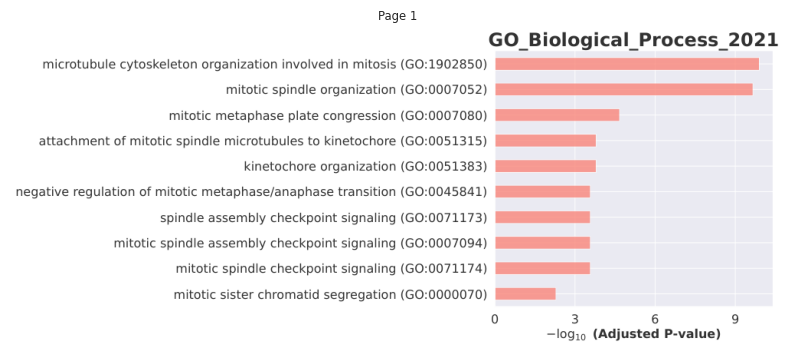

In [95]:
visualize_pdf('./test/enr_All/GO_Biological_Process_2021.Human.enrichr.reports.pdf')

In [97]:
# GO Mol Process had zero hits